<a href="https://colab.research.google.com/github/KimMunho/ComputerVision/blob/main/HW2/HW2_2020039012_KimMunho_(2_1~2_5).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
### HW2-1

Mounted at /content/drive
(a)



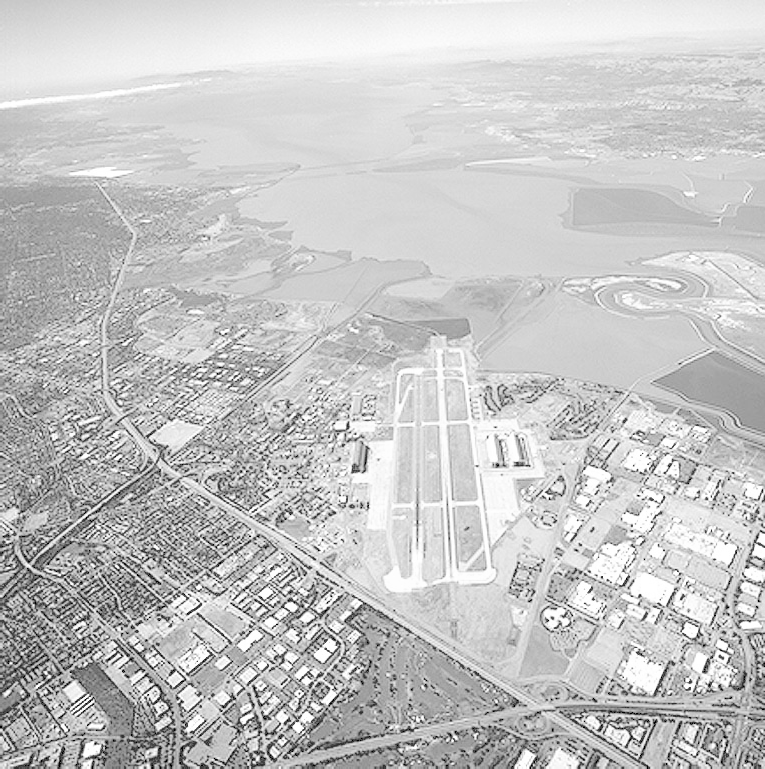

(b)



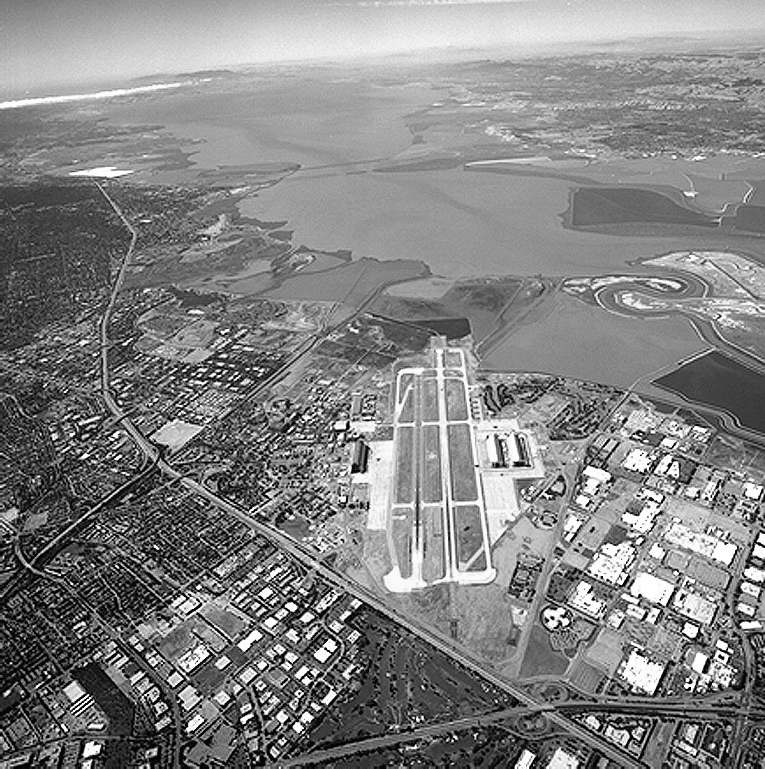

(c)



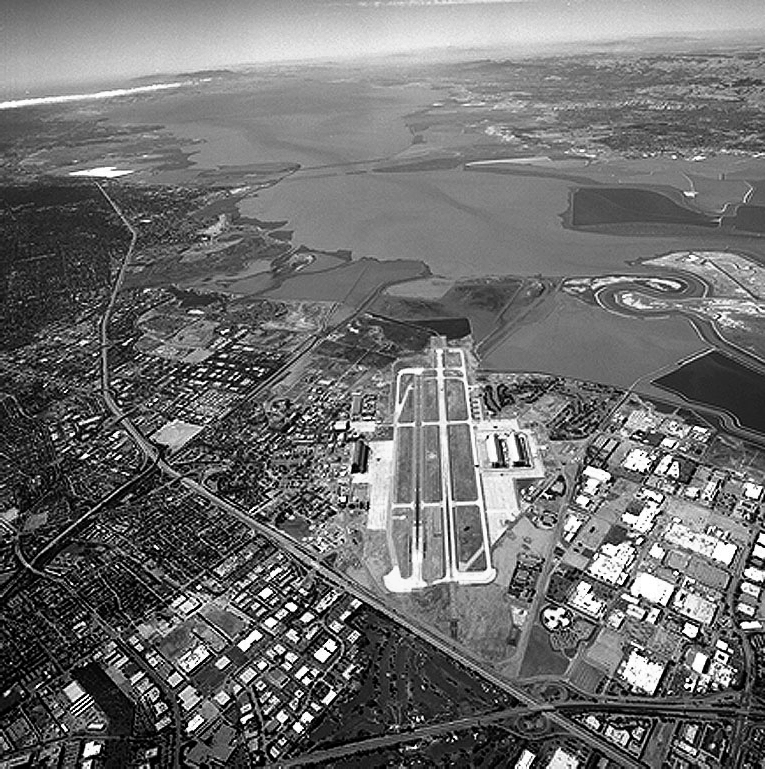

(d)



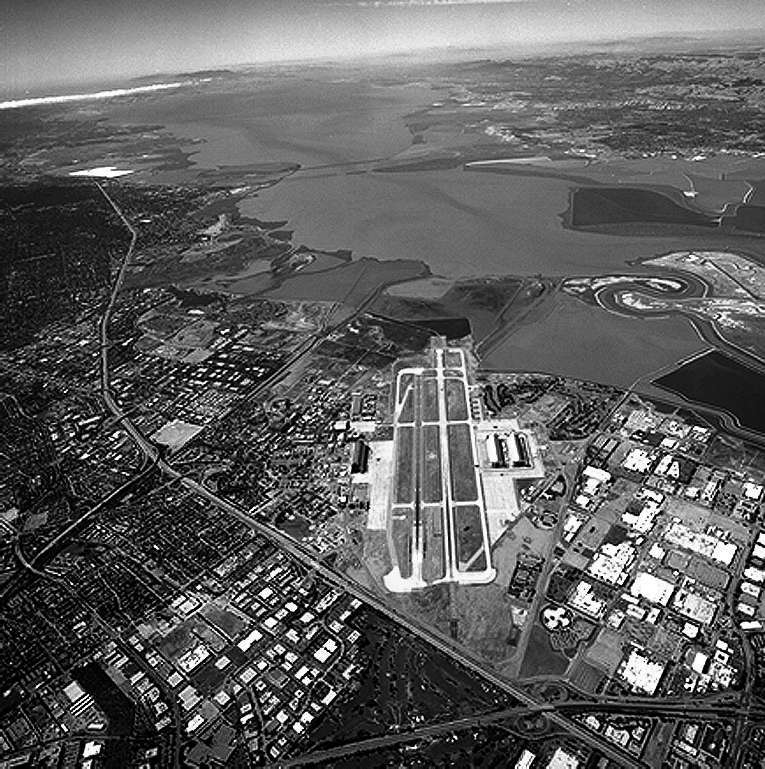

In [1]:
 # OpenCV를 사용하기 위한 초기 설정

import cv2
import numpy as np   # 넘파이 사용
import matplotlib.pyplot as plt   # matplotlib : 시각화라이브러리
from google.colab.patches import cv2_imshow    # colab에서 cv.imshow 사용

# 이미지 불러오기

from google.colab import drive
drive.mount('/content/drive')

img_path = '/content/drive/MyDrive/Colab Notebooks/ComputerVision/HW2/Fig3.9(a).tif'
img = cv2.imread(img_path)

if img is None:
    print("Import Failed")


def gamma_transform(img, gamma, c=1.0):
    img_norm = img / 255.0  # [0, 1] 범위로 정규화
    img_gamma = c * np.power(img_norm, gamma)
    img_result = np.clip(img_gamma * 255.0, 0, 255).astype(np.uint8)
    return img_result


### (a) - 원본 이미지
print("(a)\n")
cv2_imshow(img)

### (b) - c=1, 감마=3
print("(b)\n")
img_b = gamma_transform(img, 3.0)
cv2_imshow(img_b)


### (c) - c=1, 감마=4
print("(c)\n")
img_c = gamma_transform(img, 4.0)
cv2_imshow(img_c)

### (d) c=1, 감마=5
print("(d)\n")
img_d = gamma_transform(img, 5.0)
cv2_imshow(img_d)

# c=1로 고정한 상태에서 감마 값이 커질수록 이미지가 어두워지고, 어두운 부분은 더 어두워져 명암 대비가 증가한다.




In [ ]:
### HW2-2

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
원본이미지



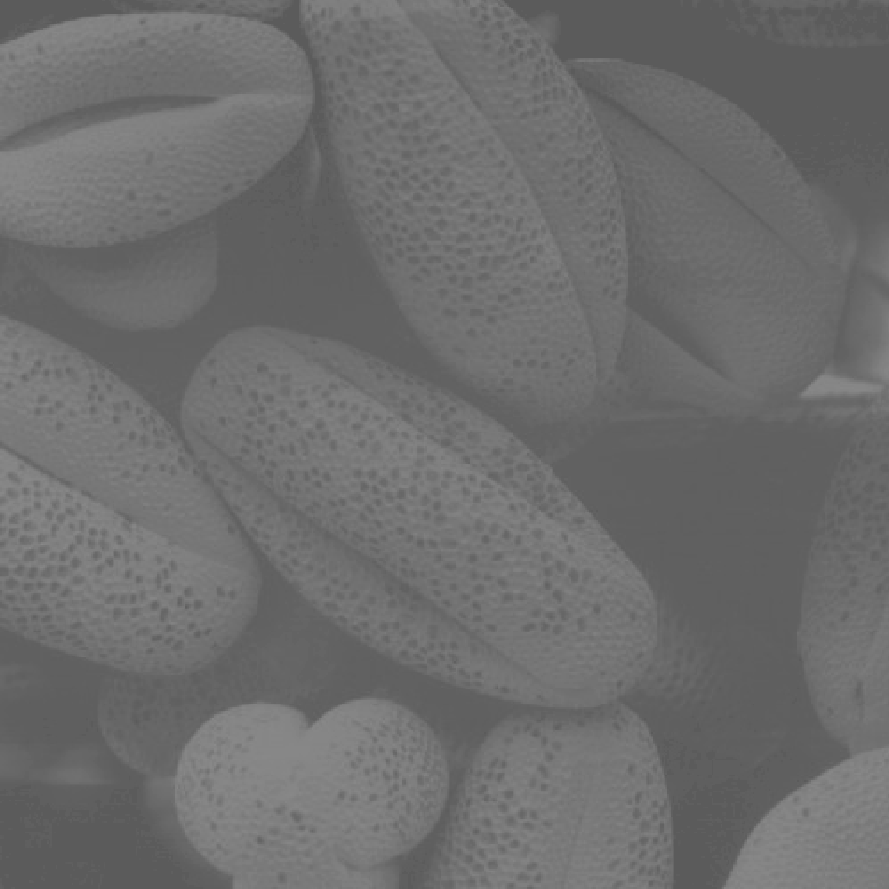

(a)



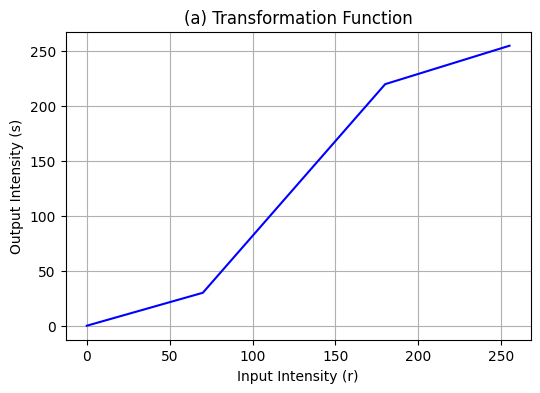

(b)



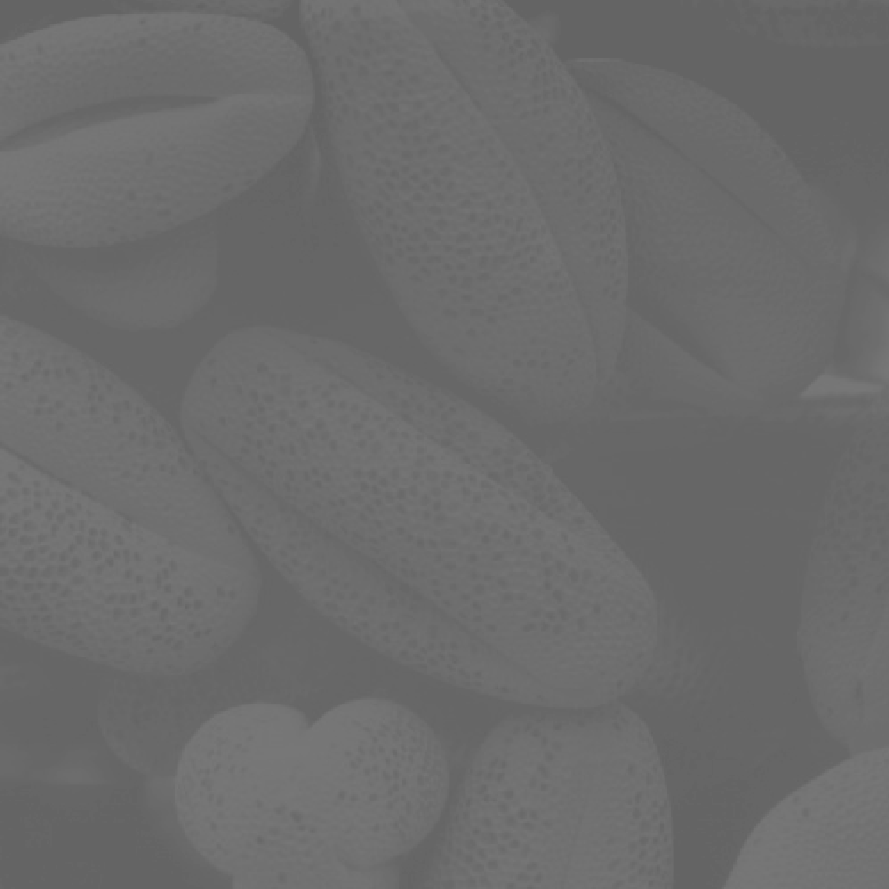

(c)



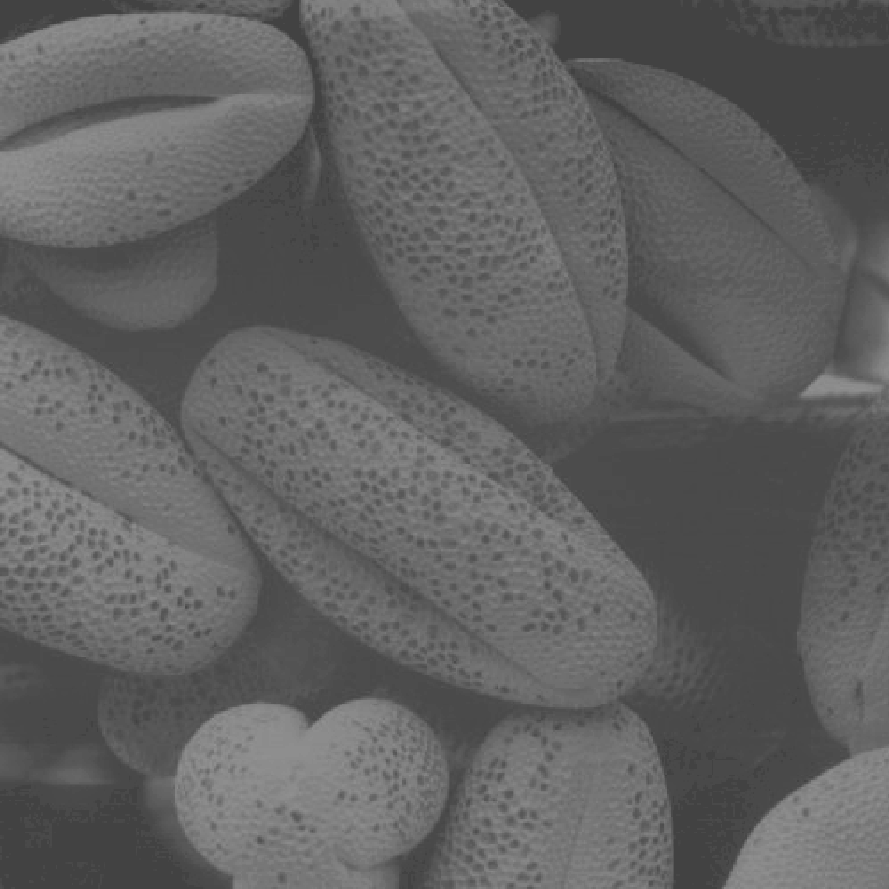

(d)



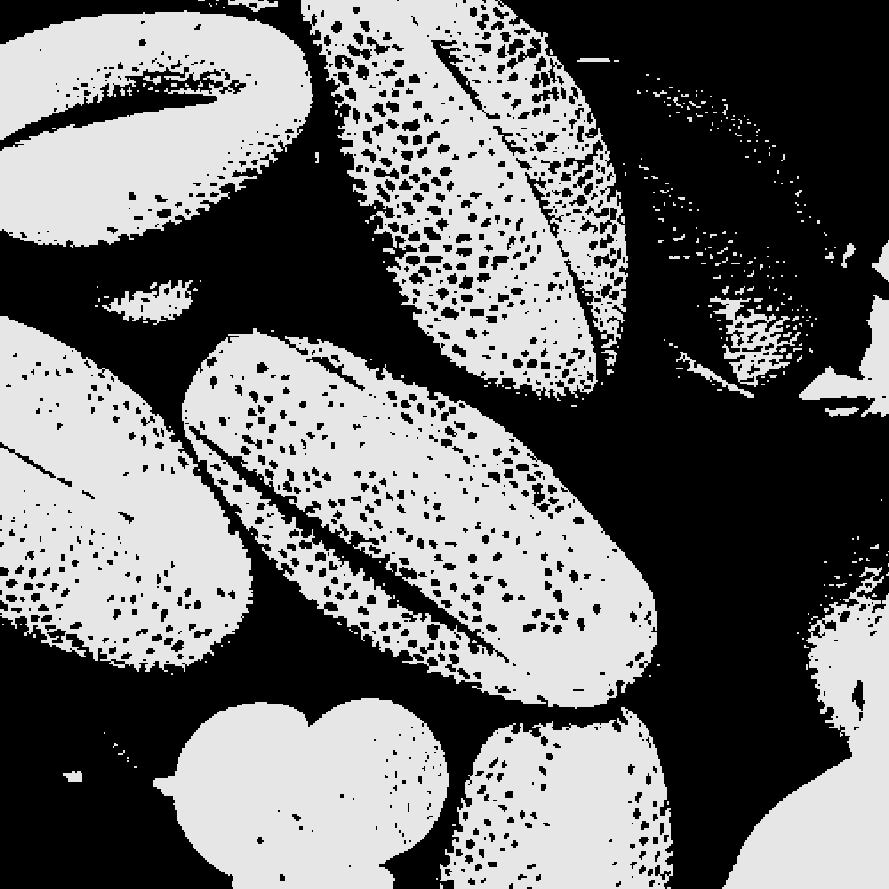

In [ ]:
 # OpenCV를 사용하기 위한 초기 설정

import cv2
import numpy as np   # 넘파이 사용
import matplotlib.pyplot as plt   # matplotlib : 시각화라이브러리
from google.colab.patches import cv2_imshow    # colab에서 cv.imshow 사용

# 이미지 불러오기

from google.colab import drive
drive.mount('/content/drive')

img_path = '/content/drive/MyDrive/Colab Notebooks/ComputerVision/HW2/Fig3.10(b).tif'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Import Failed")

import matplotlib.pyplot as plt

# 원본 이미지
print("원본이미지\n")
cv2_imshow(img)


### (a) - 이미지 대비 향상을 위한 변환 함수 시각

# r1, s1 = 입력 밝기값의 기준 구간
r1, s1 = 70, 30
# r2. s2 = 해당 구간에서 출력 밝기값
r2, s2 = 180, 220
# (r1, s1)부터 (r2, s2) 사이를 선형적으로 늘려서 명암 대비를 증가


# 입력 밝기값 r을 받아서 출력 밝기값 s로 변환하는 함수
def transformation_function(r):
    if r < r1:
      # 0 → s1 : 어두운 영역 처리
        return (s1 / r1) * r
    elif r <= r2:
      # s1 → s2	: 대비 강조 구간
        return ((s2 - s1) / (r2 - r1)) * (r - r1) + s1
    else:
      # s2 → 255	: 밝은 영역 처리
        return ((255 - s2) / (255 - r2)) * (r - r2) + s2

# x축: 입력 밝기값 (0~255)
x_vals = list(range(256))

# y축: 변환 함수에 적용한 출력값
y_vals = [transformation_function(int(r)) for r in x_vals]

# 결국 (입력 밝기, 출력 밝기) 쌍을 만들어서 시각화

print("(a)\n")
plt.figure(figsize=(6, 4))
plt.plot(x_vals, y_vals, color='blue')
plt.title("(a) Transformation Function")
plt.xlabel("Input Intensity (r)")
plt.ylabel("Output Intensity (s)")
plt.grid(True)
plt.show()

### (b) - 저대비 적용 (밝은 부분과 어두운 부분의 구분이 잘 안 되는 이미지)
print("(b)\n")

low_contrast_img = cv2.normalize(img, None, alpha=100, beta=120, norm_type=cv2.NORM_MINMAX)
# 알파값과 베타값에 차이를 작게 설정 (차이 : 20)
cv2_imshow(low_contrast_img)


### (c) - Contrast Stretching 적용 (밝은 부분과 어두운 부분의 구분을 확실하게 해줌)
print("(c)\n")

def contrast_stretching(img, r1, s1, r2, s2):
    output = np.zeros_like(img, dtype=np.uint8)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            r = img[i, j]
            if r < r1:
                output[i, j] = int((s1 / r1) * r)
            elif r <= r2:
                output[i, j] = int(((s2 - s1) / (r2 - r1)) * (r - r1) + s1)
            else:
                output[i, j] = int(((255 - s2) / (255 - r2)) * (r - r2) + s2)
    return output

# 픽셀 값을 0~255으로 설정

stretched_img = contrast_stretching(img, r1, s1, r2, s2)
cv2_imshow(stretched_img)

### (d) - Thresholding 적용 (밝기값이 임계값보다 크면 흰색(255), 작으면 검정(0) 설정)
print("(d)\n")

value1 = 110
value2 = 230
# value1의 값이 클수록 밝은 이미지 생성, value1의 값이 작을수록 어두운 이미지 생성
# value2의 값이 클수록 흑백의 차이가 확실하고 value2의 값이 작을수록 흑백의 차이가 약해지기 때문에 회색빛(value2=180)이 돈다
# value1과 value2의 차이가 클수록 더 강한 대비가 생긴다
thresholded_img = cv2.threshold(img, value1, value2, cv2.THRESH_BINARY)[1]
cv2_imshow(thresholded_img)







In [ ]:
### HW2-3

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
원본이미지



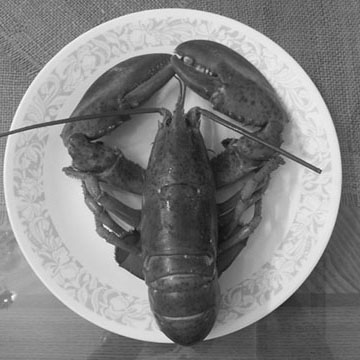

1번 마스크 사용



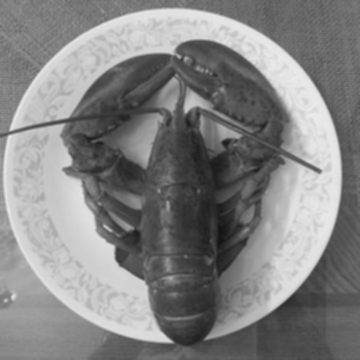

2번 마스크 사용



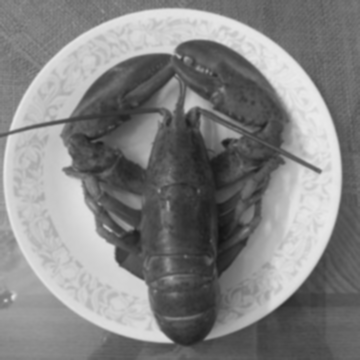

3번 마스크 사용



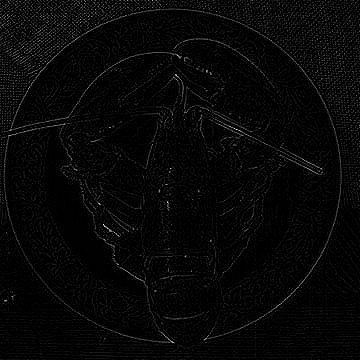

4번 마스크 사용



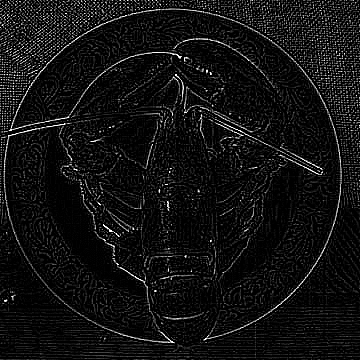

5번 마스크 사용



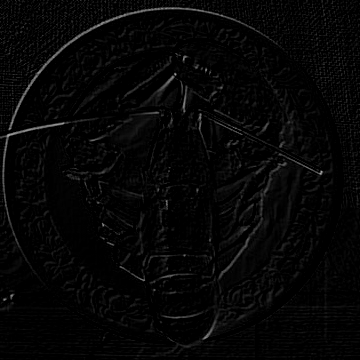

6번 마스크 사용



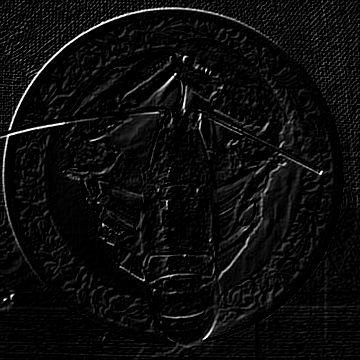

In [ ]:
 # OpenCV를 사용하기 위한 초기 설정

import cv2
import numpy as np   # 넘파이 사용
import matplotlib.pyplot as plt   # matplotlib : 시각화라이브러리
from google.colab.patches import cv2_imshow    # colab에서 cv.imshow 사용

# 이미지 불러오기

from google.colab import drive
drive.mount('/content/drive')

img_path = '/content/drive/MyDrive/Colab Notebooks/ComputerVision/HW2/add1.jpg'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Import Failed")

import matplotlib.pyplot as plt

# 원본 이미지
print("원본이미지\n")
cv2_imshow(img)

# 마스크를 사용하여 컨볼루션


### 1번 마스크 사용 - 평균 필터 (3x3)
# 이미지가 부드러워 지고 흐려진다

avg_kernel = np.array([
    [1/9, 1/9, 1/9],
    [1/9, 1/9, 1/9],
    [1/9, 1/9, 1/9]
], dtype=np.float32)
avg_blur = cv2.filter2D(img, -1, avg_kernel)

print("1번 마스크 사용\n")
cv2_imshow(avg_blur)


### 2번 마스크 사용 - 가우시안 필터 (5x5, 고정 가중치)
# 위의 평균 필터보다 조금 더 자연스럼게 흐려진다

gaussian_kernel = np.array([
    [0.0030, 0.0133, 0.0219, 0.0133, 0.0030],
    [0.0133, 0.0596, 0.0983, 0.0596, 0.0133],
    [0.0219, 0.0983, 0.1621, 0.0983, 0.0219],
    [0.0133, 0.0596, 0.0983, 0.0596, 0.0133],
    [0.0030, 0.0133, 0.0219, 0.0133, 0.0030]
], dtype=np.float32)
gaussian_blur = cv2.filter2D(img, -1, gaussian_kernel)

print("2번 마스크 사용\n")
cv2_imshow(gaussian_blur)


### 3번 마스크 사용 - 4방향 Laplacian 필터
# 전체적으로 어두워지고 거의 윤곽선만 남아있다

laplacian_kernel = np.array([
    [0, -1, 0],
    [-1, 4, -1],
    [0, -1, 0]
], dtype=np.float32)
Laplacian4 = cv2.filter2D(img, -1, laplacian_kernel)

print("3번 마스크 사용\n")
cv2_imshow(Laplacian4)

### 4번 마스크 사용 - 8방향 Laplacian 필터
# 4방향 Laplacian 필터보다는 밝지만 여전희 윤곽선에 표현이 집중된다

laplacian_kernel_8dir = np.array([
    [-1, -1, -1],
    [-1,  8, -1],
    [-1, -1, -1]
], dtype=np.float32)

Laplacian8 = cv2.filter2D(img, -1, laplacian_kernel_8dir)

print("4번 마스크 사용\n")
cv2_imshow(Laplacian8)


### 5번 마스크 사용 - 수직 엣지 필터 1
# 어두운 공간에서 동남방향으로 빛을 비추는 느낌의 효과가 나타남

kernel_1 = np.array([
    [-1, 0, 0],
    [ 0, 0, 0],
    [ 0, 0, 1]
], dtype=np.float32)
edge_1 = cv2.filter2D(img, -1, kernel_1)

print("5번 마스크 사용\n")
cv2_imshow(edge_1)


### 6번 마스크 사용 - 수직 엣지 필터 2
# 위의 수직 엣지 필터 1과 비슷한 효과이지만 조금 더 밝은 빛을 비추는 느낌이 나타남

kernel_2 = np.array([
    [-1, -1,  0],
    [-1,  0,  1],
    [ 0,  1,  1]
], dtype=np.float32)
edge_2 = cv2.filter2D(img, -1, kernel_2)

print("6번 마스크 사용\n")
cv2_imshow(edge_2)



In [ ]:
### HW2-4

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
원본이미지



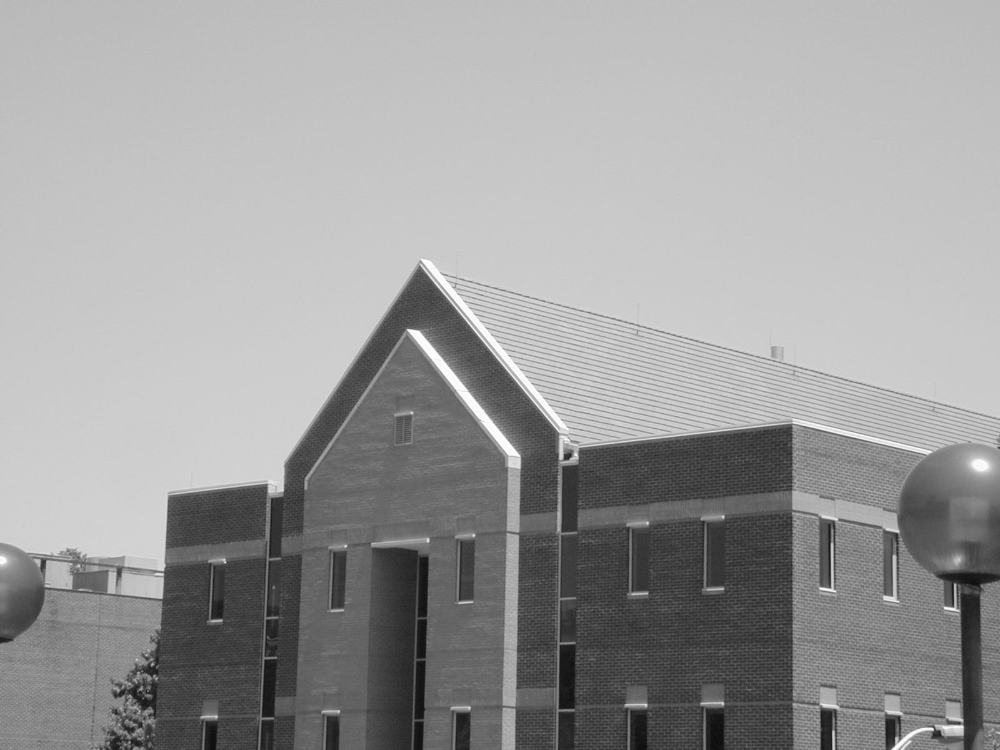

↗ 방향 엣지 (45도)


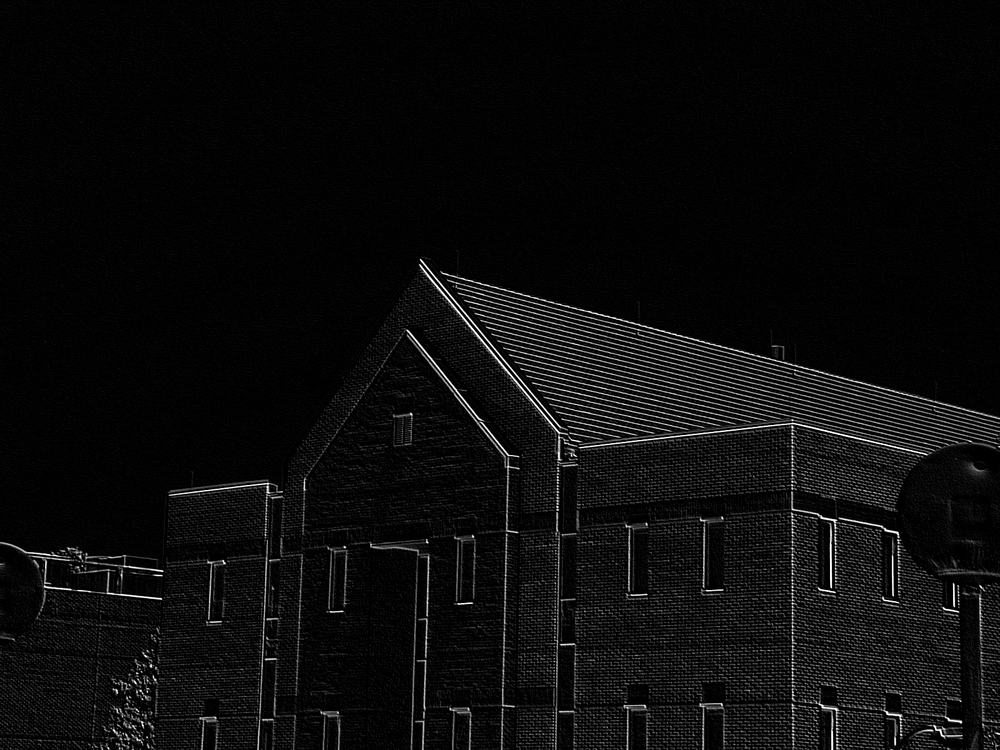

↘ 방향 엣지 (-45도)


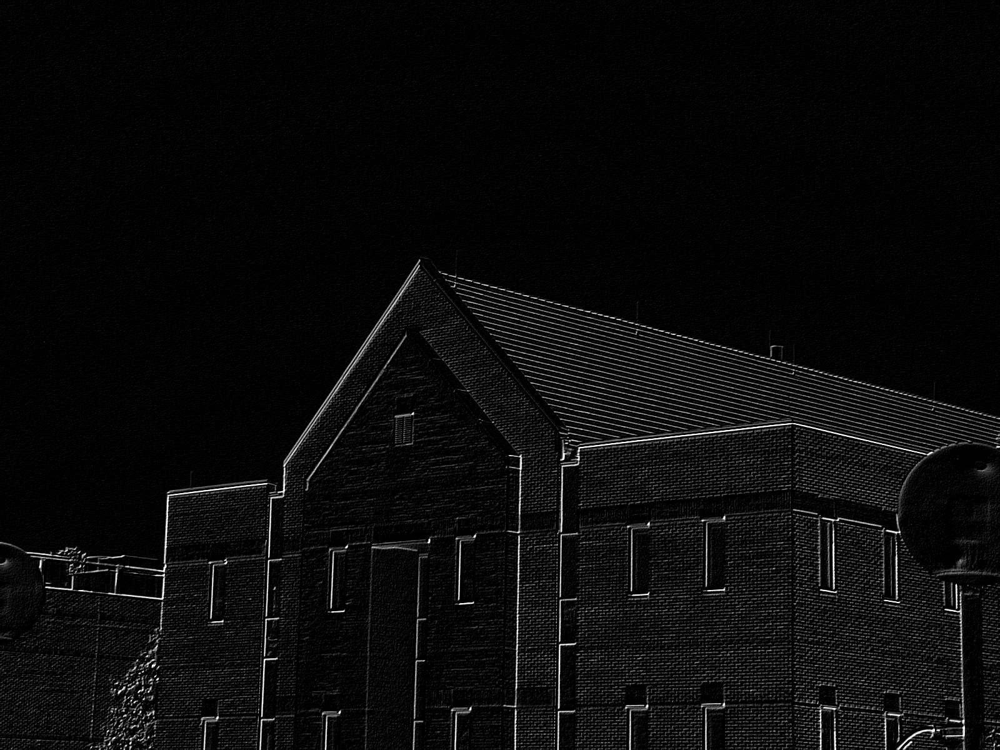

In [ ]:
 # OpenCV를 사용하기 위한 초기 설정

import cv2
import numpy as np   # 넘파이 사용
import matplotlib.pyplot as plt   # matplotlib : 시각화라이브러리
from google.colab.patches import cv2_imshow    # colab에서 cv.imshow 사용

# 이미지 불러오기

from google.colab import drive
drive.mount('/content/drive')

img_path = '/content/drive/MyDrive/Colab Notebooks/ComputerVision/HW2/school.jpg'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Import Failed")

import matplotlib.pyplot as plt

# 원본 이미지
print("원본이미지\n")
cv2_imshow(img)

# Sobel 45도 방향
sobel_45 = np.array([
    [0,  1,  2],
    [-1, 0,  1],
    [-2, -1, 0]
], dtype=np.float32)

# Sobel -45도 방향
sobel_neg_45 = np.array([
    [2,  1,  0],
    [1,  0, -1],
    [0, -1, -2]
], dtype=np.float32)

# 각각 필터 적용
edge_45 = cv2.filter2D(img, -1, sobel_45)
edge_neg_45 = cv2.filter2D(img, -1, sobel_neg_45)

# 결과 출력
print("↗ 방향 엣지 (45도)")
cv2_imshow(edge_45)

print("↘ 방향 엣지 (-45도)")
cv2_imshow(edge_neg_45)




In [ ]:
 ### HW2-5

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
원본이미지



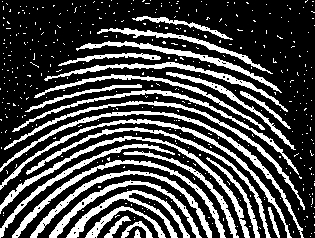

Opening만 적용



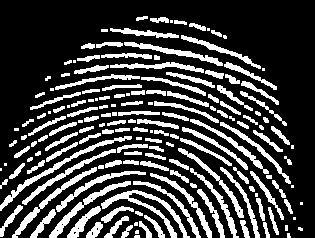

Opening 후 closing



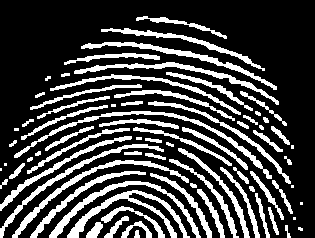

In [ ]:
# OpenCV를 사용하기 위한 초기 설정

import cv2
import numpy as np   # 넘파이 사용
import matplotlib.pyplot as plt   # matplotlib : 시각화라이브러리
from google.colab.patches import cv2_imshow    # colab에서 cv.imshow 사용

# 이미지 불러오기

from google.colab import drive
drive.mount('/content/drive')

img_path = '/content/drive/MyDrive/Colab Notebooks/ComputerVision/HW2/finger.jpg'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
_, bin_img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

if img is None:
    print("Import Failed")

import matplotlib.pyplot as plt

# 원본 이미지
print("원본이미지\n")
cv2_imshow(bin_img)

# 지문의 윤곽선을 강조하기 위해 밝은 영역을 줄여 잡음을 제거 (침식) + 제거된 부분을 다시 채우기 (팽창) = opening
# opening만 하면 흰색 영역 중에 끊어지는 부분이 생기기 때문에 closing 까지 하면 보다 자연스럽게 흰색 영역을 강조할 수 있다. = opening 후 closing

# 구조 요소 정의 (3x3 정방형)
kernel = np.ones((3, 3), np.uint8)

# Opening만 적용
opened = cv2.morphologyEx(bin_img, cv2.MORPH_OPEN, kernel)
print("Opening만 적용\n")
cv2_imshow(opened)

# Opening 후 Closing
open_then_close = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel)
print("Opening 후 closing\n")
cv2_imshow(open_then_close)
